<a href="https://colab.research.google.com/github/OutAway/PhleboVision/blob/main/Mask_RCNN_R50FPN_Detectron_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install detectron2

In [1]:
!pip install numpy
!pip install roboflow
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Obtaining dependency information for roboflow from https://files.pythonhosted.org/packages/2f/bc/e6866fe247a8ef02f9de9f7a62d0af00b363212b37b72779ed1997cbe6d6/roboflow-1.1.17-py3-none-any.whl.metadata
  Obtaining dependency information for certifi==2023.7.22 from https://files.pythonhosted.org/packages/4c/dd/2234eab22353ffc7d94e8d13177aaa050113286e93e7b40eae01fbf7c3d9/certifi-2023.7.22-py3-none-any.whl.metadata
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.9 MB/s eta 0:00:00
  Obtaining dependency information for opencv-python-headless==4.8.0.74 from https://files.pythonhosted.org/packages/76/02/f128517f3ade4bb5f71e2afd8461dba70e3f466ce745fa1fd1fade9ad1b7/opencv_python_headless-4.8.0.74-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata
  Obtaining dependency information for supervision from https://files.pythonhosted.org/packages/53/f7/490cf47d2141f5cc8eeb944b90108cdea5ccfcd

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
#from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

#Dataset upload from roboflow
from roboflow import Roboflow

import logging
import torch
from collections import OrderedDict
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultTrainer
from detectron2.utils.visualizer import ColorMode
from detectron2.solver import build_lr_scheduler, build_optimizer
from detectron2.checkpoint import DetectionCheckpointer, PeriodicCheckpointer
from detectron2.utils.events import EventStorage
from detectron2.modeling import build_model
import detectron2.utils.comm as comm
from detectron2.engine import default_argument_parser, default_setup, default_writers, launch
from detectron2.data import (
    MetadataCatalog,
    build_detection_test_loader,
    build_detection_train_loader,
)
from detectron2.evaluation import (
    CityscapesInstanceEvaluator,
    CityscapesSemSegEvaluator,
    COCOEvaluator,
    COCOPanopticEvaluator,
    DatasetEvaluators,
    LVISEvaluator,
    PascalVOCDetectionEvaluator,
    SemSegEvaluator,
    inference_on_dataset,
    print_csv_format,
)

from roboflow import Roboflow

from matplotlib import pyplot as plt
from PIL import Image

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  2.0 ; cuda:  2.0.0
detectron2: 0.6


A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3


# Run a pre-trained detectron2 model

We first download an image from the COCO dataset:

Then, we create a detectron2 config and a detectron2 `DefaultPredictor` to run inference on this image.

# Train on a custom dataset

In this section, we show how to train an existing detectron2 model on a custom dataset in a new format.

We use [catvsdogs dataset](https://github.com/mharunturkmenoglu/detectron2_catsvsdogs)
which only has two classes: cats and dogs.
We'll train a segmentation model from an existing model pre-trained on COCO dataset, available in detectron2's model zoo.

## Prepare the dataset

In [3]:
from roboflow import Roboflow
rf = Roboflow(api_key="AsM0rjcGhlXcnD5PTZ6z")
project = rf.workspace("patyas").project("phlebo_ed3")
dataset = project.version(1).download("coco-segmentation")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to phlebo_ed3-1 in coco-segmentation:: 100%|██████████| 284/284 [00:00<00:00, 7086.49it/s]


Register the dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we write a function to parse it and prepare it into detectron2's standard format. User should write such a function when using a dataset in custom format. See the tutorial for more details.

In [4]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("ed_train_dataset", {}, "/kaggle/input/phlebo-final/train/_annotations.coco.json", "/kaggle/input/phlebo-final/train")
register_coco_instances("ed_val_dataset", {}, "/kaggle/input/phlebo-final/valid/_annotations.coco.json", "/kaggle/input/phlebo-final/valid")

To verify the dataset is in correct format, let's visualize the annotations of randomly selected samples in the training set:

## Train!

Now, let's fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the dataset.

In [5]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("ed_train_dataset",)#Train dataset registered in a previous cell
cfg.DATASETS.TEST = ("ed_val_dataset",)#Test dataset registered in a previous cell
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 50000 #We found that with a patience of 500, training will early stop before 10,000 iterations
cfg.SOLVER.STEPS = []
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2 # 26 letters plus one super class
cfg.TEST.EVAL_PERIOD = 0 # Increase this number if you want to monitor validation performance during training

PATIENCE = 5000 #Early stopping will occur after N iterations of no imporovement in total_loss

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [6]:
def get_evaluator(cfg, dataset_name, output_folder=None):
    """
    Create evaluator(s) for a given dataset.
    This uses the special metadata "evaluator_type" associated with each builtin dataset.
    For your own dataset, you can simply create an evaluator manually in your
    script and do not have to worry about the hacky if-else logic here.
    """
    if output_folder is None:
        output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
    evaluator_list = []
    evaluator_type = MetadataCatalog.get(dataset_name).evaluator_type
    if evaluator_type in ["sem_seg", "coco_panoptic_seg"]:
        evaluator_list.append(
            SemSegEvaluator(
                dataset_name,
                distributed=True,
                output_dir=output_folder,
            )
        )
    if evaluator_type in ["coco", "coco_panoptic_seg"]:
        evaluator_list.append(COCOEvaluator(dataset_name, output_dir=output_folder))
    if evaluator_type == "coco_panoptic_seg":
        evaluator_list.append(COCOPanopticEvaluator(dataset_name, output_folder))
    if evaluator_type == "cityscapes_instance":
        return CityscapesInstanceEvaluator(dataset_name)
    if evaluator_type == "cityscapes_sem_seg":
        return CityscapesSemSegEvaluator(dataset_name)
    if evaluator_type == "pascal_voc":
        return PascalVOCDetectionEvaluator(dataset_name)
    if evaluator_type == "lvis":
        return LVISEvaluator(dataset_name, cfg, True, output_folder)
    if len(evaluator_list) == 0:
        raise NotImplementedError(
            "no Evaluator for the dataset {} with the type {}".format(dataset_name, evaluator_type)
        )
    if len(evaluator_list) == 1:
        return evaluator_list[0]
    return DatasetEvaluators(evaluator_list)

def do_test(cfg, model):
    results = OrderedDict()
    for dataset_name in cfg.DATASETS.TEST:
        data_loader = build_detection_test_loader(cfg, dataset_name)
        evaluator = get_evaluator(
            cfg, dataset_name, os.path.join(cfg.OUTPUT_DIR, "inference", dataset_name)
        )
        results_i = inference_on_dataset(model, data_loader, evaluator)
        results[dataset_name] = results_i
        if comm.is_main_process():
            logger.info("Evaluation results for {} in csv format:".format(dataset_name))
            print_csv_format(results_i)
    if len(results) == 1:
        results = list(results.values())[0]
    return results


logger = logging.getLogger("detectron2")
resume=False
model = build_model(cfg)
optimizer = build_optimizer(cfg, model)
scheduler = build_lr_scheduler(cfg, optimizer)

BEST_LOSS = np.inf

checkpointer = DetectionCheckpointer(
    model, cfg.OUTPUT_DIR, optimizer=optimizer, scheduler=scheduler
)
start_iter = (
    checkpointer.resume_or_load(cfg.MODEL.WEIGHTS, resume=resume).get("iteration", -1) + 1
)
prev_iter = start_iter
max_iter = cfg.SOLVER.MAX_ITER

periodic_checkpointer = PeriodicCheckpointer(
    checkpointer, cfg.SOLVER.CHECKPOINT_PERIOD, max_iter=max_iter
)

writers = default_writers(cfg.OUTPUT_DIR, max_iter) if comm.is_main_process() else []

# compared to "train_net.py", we do not support accurate timing and
# precise BN here, because they are not trivial to implement in a small training loop
data_loader = build_detection_train_loader(cfg)
logger.info("Starting training from iteration {}".format(start_iter))
patience_counter = 0
with EventStorage(start_iter) as storage:
    for data, iteration in zip(data_loader, range(start_iter, max_iter)):
        storage.iter = iteration

        loss_dict = model(data)
        losses = sum(loss_dict.values())
        assert torch.isfinite(losses).all(), loss_dict

        loss_dict_reduced = {k: v.item() for k, v in comm.reduce_dict(loss_dict).items()}
        losses_reduced = sum(loss for loss in loss_dict_reduced.values())
        if comm.is_main_process():
            storage.put_scalars(total_loss=losses_reduced, **loss_dict_reduced)

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        storage.put_scalar("lr", optimizer.param_groups[0]["lr"], smoothing_hint=False)
        scheduler.step()

        if (
            cfg.TEST.EVAL_PERIOD > 0
            and (iteration + 1) % cfg.TEST.EVAL_PERIOD == 0
            and iteration != max_iter - 1
        ):
            do_test(cfg, model)
            # Compared to "train_net.py", the test results are not dumped to EventStorage
            comm.synchronize()

        if iteration - start_iter > 5 and (
            (iteration + 1) % 20 == 0 or iteration == max_iter - 1
        ):
            for writer in writers:
                writer.write()
        periodic_checkpointer.step(iteration)

        if iteration > prev_iter:
            prev_iter = iteration
            if losses_reduced < BEST_LOSS:
                BEST_LOSS = losses_reduced
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter % 100 == 0:
                    print(f"Loss has not improved for {patience_counter} iterations")
                if patience_counter >= PATIENCE:
                    print(f"EARLY STOPPING")
                    break



[01/25 22:39:19 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


model_final_f10217.pkl: 178MB [00:00, 214MB/s]                             


WARNING [01/25 22:39:20 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/25 22:39:20 d2.data.datasets.coco]: Loaded 193 images in COCO format from /kaggle/input/phlebo-final/train/_annotations.coco.json
[01/25 22:39:20 d2.data.build]: Removed 0 images with no usable annotations. 193 images left.
[01/25 22:39:20 d2.data.build]: Distribution of instances among all 3 categories:
|   category    | #instances   |  category  | #instances   |  category  | #instances   |
|:-------------:|:-------------|:----------:|:-------------|:----------:|:-------------|
| Phlebo_term.. | 0            | gonocoxito | 270          | gonostilo  | 282          |
|               |              |            |              |            |              |
|     total     | 552          |            |              |            |              |
[01/25 22:39:20 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdg

torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /usr/local/src/pytorch/aten/src/ATen/native/TensorShape.cpp:3483.)


[01/25 22:39:34 d2.utils.events]:  iter: 19  total_loss: 2.025  loss_cls: 1.114  loss_box_reg: 0.1332  loss_mask: 0.6891  loss_rpn_cls: 0.0442  loss_rpn_loc: 0.03122     lr: 4.9953e-06  max_mem: 2667M
[01/25 22:39:54 d2.utils.events]:  eta: 14:00:24  iter: 39  total_loss: 1.859  loss_cls: 0.9608  loss_box_reg: 0.1384  loss_mask: 0.6849  loss_rpn_cls: 0.04237  loss_rpn_loc: 0.02868     lr: 9.9902e-06  max_mem: 2669M
[01/25 22:40:03 d2.utils.events]:  eta: 6:13:49  iter: 59  total_loss: 1.584  loss_cls: 0.6753  loss_box_reg: 0.1268  loss_mask: 0.6779  loss_rpn_cls: 0.03713  loss_rpn_loc: 0.02657     lr: 1.4985e-05  max_mem: 2669M
[01/25 22:40:13 d2.utils.events]:  eta: 6:32:38  iter: 79  total_loss: 1.357  loss_cls: 0.4559  loss_box_reg: 0.1725  loss_mask: 0.6696  loss_rpn_cls: 0.04695  loss_rpn_loc: 0.03025     lr: 1.998e-05  max_mem: 2669M
[01/25 22:40:22 d2.utils.events]:  eta: 6:20:43  iter: 99  total_loss: 1.196  loss_cls: 0.3123  loss_box_reg: 0.178  loss_mask: 0.656  loss_rpn_cls:

In [7]:
do_test(cfg, model)

WARNING [01/26 01:04:02 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/26 01:04:02 d2.data.datasets.coco]: Loaded 55 images in COCO format from /kaggle/input/phlebo-final/valid/_annotations.coco.json
[01/26 01:04:02 d2.data.build]: Distribution of instances among all 3 categories:
|   category    | #instances   |  category  | #instances   |  category  | #instances   |
|:-------------:|:-------------|:----------:|:-------------|:----------:|:-------------|
| Phlebo_term.. | 0            | gonocoxito | 73           | gonostilo  | 79           |
|               |              |            |              |            |              |
|     total     | 152          |            |              |            |              |
[01/26 01:04:02 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/26 01:04:02 d2.data

OrderedDict([('bbox',
              {'AP': 33.88379068503603,
               'AP50': 43.899341651287145,
               'AP75': 39.374130555552256,
               'APs': nan,
               'APm': 26.584158415841586,
               'APl': 34.2714689764286,
               'AP-Phlebo_terminalia': nan,
               'AP-gonocoxito': 67.76758137007207,
               'AP-gonostilo': 0.0}),
             ('segm',
              {'AP': 30.79655098749672,
               'AP50': 43.899341651287145,
               'AP75': 36.37734999175024,
               'APs': nan,
               'APm': 21.633663366336634,
               'APl': 31.655237106748473,
               'AP-Phlebo_terminalia': nan,
               'AP-gonocoxito': 61.593101974993445,
               'AP-gonostilo': 0.0})])

In [8]:
torch.save(model.state_dict(),'phlebo_model_final.pth')

In [9]:
# Look at training curves in tensorboard:
# %load_ext tensorboard
# %tensorboard --logdir output

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:

Then, we randomly select several samples to visualize the prediction results.

[01/26 01:06:05 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /kaggle/working/phlebo_model_final.pth ...
WARNING [01/26 01:06:05 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/26 01:06:05 d2.data.datasets.coco]: Loaded 55 images in COCO format from /kaggle/input/phlebo-final/valid/_annotations.coco.json


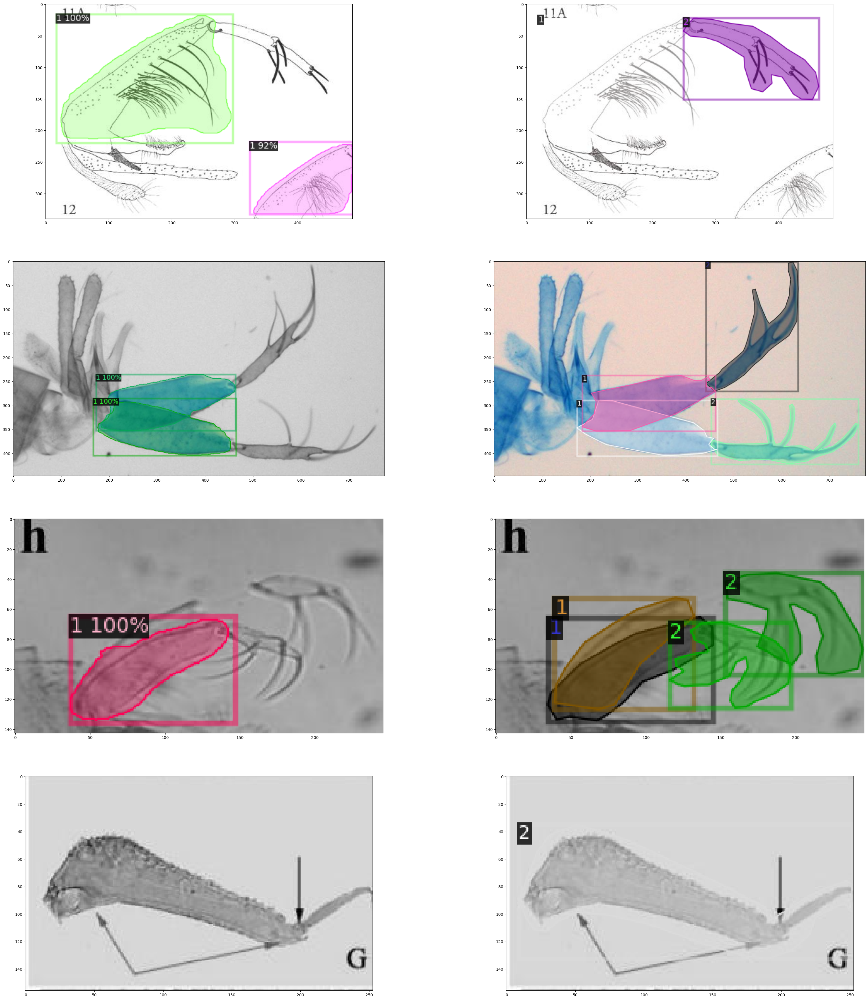

In [13]:
from detectron2.utils.visualizer import ColorMode
import matplotlib.pyplot as plt

# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = "/kaggle/working/phlebo_model_final.pth"  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.3   # set a custom testing threshold
predictor = DefaultPredictor(cfg)



dataset_dicts = DatasetCatalog.get('ed_val_dataset')
outs = []
for d in random.sample(dataset_dicts, 4):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata = MetadataCatalog.get('train_dataset'),

                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out_pred = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    visualizer = Visualizer(im[:, :, ::-1], metadata=MetadataCatalog.get('train_dataset1'))
    out_target = visualizer.draw_dataset_dict(d)
    outs.append(out_pred)
    outs.append(out_target)
_,axs = plt.subplots(len(outs)//2,2,figsize=(40,45))
for ax, out in zip(axs.reshape(-1), outs):
    ax.imshow(out.get_image()[:, :, ::-1])

[01/26 01:09:08 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /kaggle/working/phlebo_model_final.pth ...


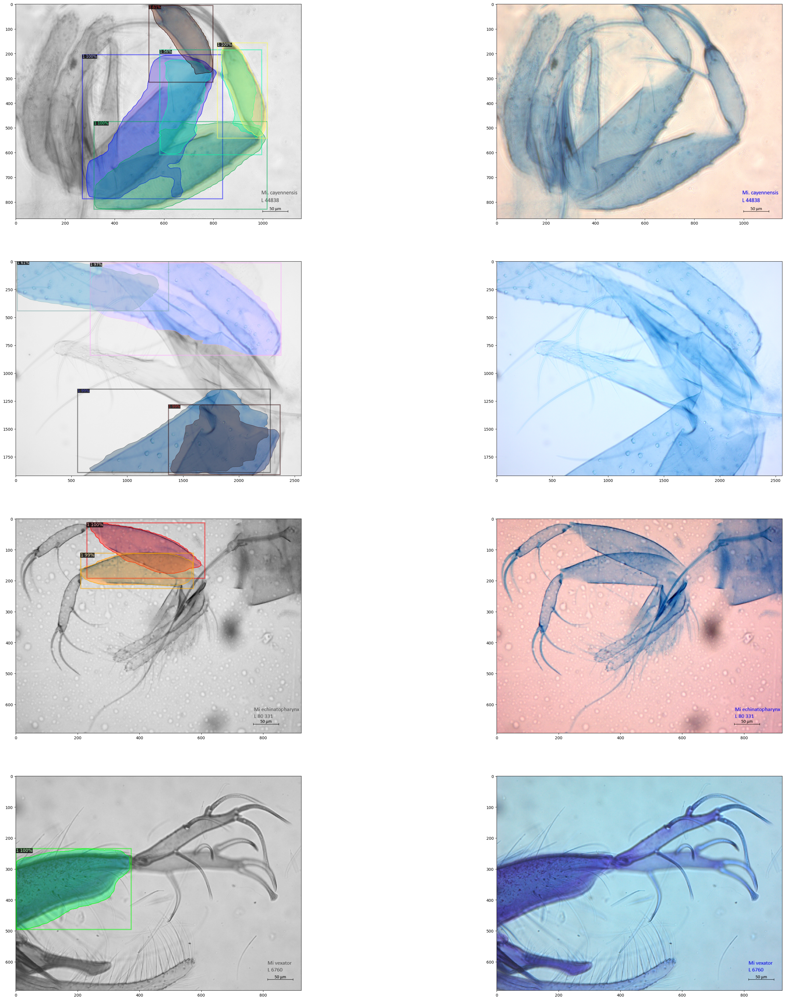

In [15]:
from detectron2.utils.visualizer import ColorMode
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
import matplotlib.pyplot as plt
import cv2
import os
import random

def visualize_random_detection_results(folder_path, model_weights, N=4, score_thresh=0.5):
    # Load configuration
    cfg.MODEL.WEIGHTS = model_weights
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = score_thresh
    predictor = DefaultPredictor(cfg)

    # Load dataset metadata
    MetadataCatalog.get('train_dataset')  # Update with your metadata

    # Get a list of image files in the folder
    image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

    # Randomly select N samples
    selected_images = random.sample(image_files, N)

    outs = []
    for filename in selected_images:
        image_path = os.path.join(folder_path, filename)
        im = cv2.imread(image_path)
        outputs = predictor(im)
        v = Visualizer(im[:, :, ::-1], metadata=MetadataCatalog.get('train_dataset'),
                       instance_mode=ColorMode.IMAGE_BW)
        out_pred = v.draw_instance_predictions(outputs["instances"].to("cpu"))

        visualizer = Visualizer(im[:, :, ::-1], metadata=MetadataCatalog.get('train_dataset'))
        out_target = visualizer.draw_dataset_dict({"file_name": image_path})  # You may need to adjust this based on your dataset structure

        outs.append(out_pred)
        outs.append(out_target)

    _, axs = plt.subplots(len(outs)//2, 2, figsize=(40, 45))
    for ax, out in zip(axs.reshape(-1), outs):
        ax.imshow(out.get_image()[:, :, ::-1])
    plt.show()

# Example usage
folder_path = "/kaggle/input/datastest"
model_weights = "/kaggle/working/phlebo_model_final.pth"
visualize_random_detection_results(folder_path, model_weights, N=4)

We can also evaluate its performance using AP metric implemented in COCO API.

In [12]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("val_dataset", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "val_dataset")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[01/26 01:05:16 d2.evaluation.coco_evaluation]: Trying to convert 'val_dataset' to COCO format ...
[01/26 01:05:16 d2.data.datasets.coco]: Converting annotations of dataset 'val_dataset' to COCO format ...)


KeyError: "Dataset 'val_dataset' is not registered! Available datasets are: coco_2014_train, coco_2014_val, coco_2014_minival, coco_2014_valminusminival, coco_2017_train, coco_2017_val, coco_2017_test, coco_2017_test-dev, coco_2017_val_100, keypoints_coco_2014_train, keypoints_coco_2014_val, keypoints_coco_2014_minival, keypoints_coco_2014_valminusminival, keypoints_coco_2017_train, keypoints_coco_2017_val, keypoints_coco_2017_val_100, coco_2017_train_panoptic_separated, coco_2017_train_panoptic_stuffonly, coco_2017_train_panoptic, coco_2017_val_panoptic_separated, coco_2017_val_panoptic_stuffonly, coco_2017_val_panoptic, coco_2017_val_100_panoptic_separated, coco_2017_val_100_panoptic_stuffonly, coco_2017_val_100_panoptic, lvis_v1_train, lvis_v1_val, lvis_v1_test_dev, lvis_v1_test_challenge, lvis_v0.5_train, lvis_v0.5_val, lvis_v0.5_val_rand_100, lvis_v0.5_test, lvis_v0.5_train_cocofied, lvis_v0.5_val_cocofied, cityscapes_fine_instance_seg_train, cityscapes_fine_sem_seg_train, cityscapes_fine_instance_seg_val, cityscapes_fine_sem_seg_val, cityscapes_fine_instance_seg_test, cityscapes_fine_sem_seg_test, cityscapes_fine_panoptic_train, cityscapes_fine_panoptic_val, voc_2007_trainval, voc_2007_train, voc_2007_val, voc_2007_test, voc_2012_trainval, voc_2012_train, voc_2012_val, ade20k_sem_seg_train, ade20k_sem_seg_val, ed_train_dataset, ed_val_dataset"